In [ ]:
# Today, AI is everywhere, we are able to do many things with it.
# I will be exploring one of the key areas within AI, classification, which is a field currently under research, and we have not fully yet found out the limitations
# We've trained AI which can classify animals, plants, cars, and medicine, among other things.
# However, the main problem in hand revolves around the AI's capability to effectively classify manipulated images and the extent of training required to enable the AI to reliably detect these altered images.
# This is where the AI is most vulnerable as it is not able to adapt quickly to evolving image manipulation techniques and this is what I will be aiming to research and come to a solution where I aim to see how easily I can manipulate the AI into classifying the hacked images.


582/582 [==============================] - 128s 217ms/step - loss: 0.6782 - accuracy: 0.6399 - val_loss: 0.5447 - val_accuracy: 0.7274
Number of Adversarial Images: 32
1/1 [==============================] - 0s 82ms/step


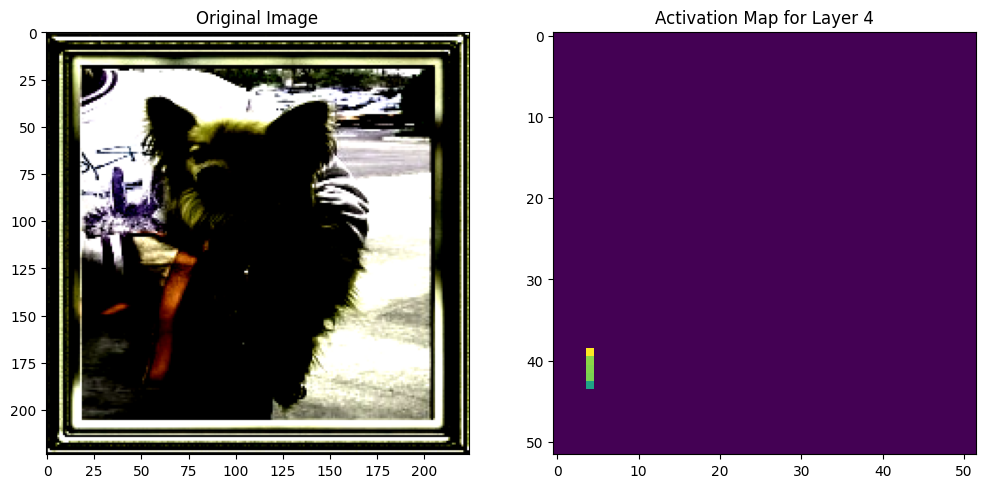

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import Sequential, layers
import matplotlib.pyplot as plt
import tensorflow_datasets as tfds
dataset, dataset_info = tfds.load('cats_vs_dogs', split='train', with_info=True, as_supervised=True)
num_classes = 2
def preprocess_image(image, label):
    image = tf.image.resize(image, (224, 224))
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_brightness(image, max_delta=0.2)
    image = tf.image.random_contrast(image, lower=0.2, upper=1.8)
    image = tf.image.random_hue(image, max_delta=0.1)
    image = tf.image.random_saturation(image, lower=0.2, upper=1.8)
    image = tf.image.per_image_standardization(image)
    label = tf.one_hot(label, num_classes)
    return image, label
dataset = dataset.map(preprocess_image)
num_samples = dataset_info.splits['train'].num_examples
num_train_samples = int(0.8 * num_samples)
num_val_samples = int(0.1 * num_samples)
num_test_samples = num_samples - num_train_samples - num_val_samples
train_dataset = dataset.take(num_train_samples)
remaining_dataset = dataset.skip(num_train_samples)
val_dataset = remaining_dataset.take(num_val_samples)
test_dataset = remaining_dataset.skip(num_val_samples)
batch_size = 32
train_dataset = train_dataset.batch(batch_size)
val_dataset = val_dataset.batch(batch_size)
test_dataset = test_dataset.batch(batch_size)
class_names = dataset_info.features['label'].names
model = Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    layers.MaxPooling2D(2, 2),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D(2, 2),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D(2, 2),
    layers.Flatten(),
    layers.Dense(512, activation='relu'),
    layers.Dense(num_classes, activation='softmax')
])
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.fit(train_dataset, epochs=1, validation_data=val_dataset)
# GAN
def build_gan():
    generator = Sequential([
        layers.Dense(256, activation='relu', input_shape=(100,)),
        layers.Reshape((4, 4, 16)),
        layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', activation='relu'),
        layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same', activation='relu'),
        layers.Conv2DTranspose(3, (4, 4), strides=(2, 2), padding='same', activation='sigmoid')
    ])

    discriminator = Sequential([
        layers.Conv2D(64, (3, 3), strides=(2, 2), padding='same', activation='relu', input_shape=(224, 224, 3)),
        layers.Conv2D(128, (3, 3), strides=(2, 2), padding='same', activation='relu'),
        layers.Flatten(),
        layers.Dense(1, activation='sigmoid')
    ])

    discriminator.trainable = False
    gan = Sequential([generator, discriminator])
    gan.compile(optimizer='adam', loss='binary_crossentropy')
art_classifier = TensorFlowV2Classifier(
    model=model,
    nb_classes=num_classes,
    input_shape=(224, 224, 3),
    loss_object=tf.keras.losses.CategoricalCrossentropy(),
)
attack = FastGradientMethod(estimator=art_classifier, eps=0.2)
adversarial_test_images = attack.generate(test_images.numpy(), y=test_labels.numpy())
num_adversarial_images = adversarial_test_images.shape[0]
print(f"Number of Adversarial Images: {num_adversarial_images}")
def generate_activation_map(model, layer_index, input_image):
    activation_model = tf.keras.models.Model(inputs=model.input, outputs=model.layers[layer_index].output)
    activation = activation_model.predict(input_image[tf.newaxis, ...])
    return activation[0]
layer_index_to_visualize = 4
image_to_visualize = test_images[0]

activation_map = generate_activation_map(model, layer_index_to_visualize, image_to_visualize)

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(image_to_visualize)
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(activation_map[:, :, 0], cmap='viridis')
plt.title(f'Activation Map for Layer {layer_index_to_visualize}')

plt.show()

#Here is my first attempt at generating a activation map to see how the AI model is being confused using ART/GAN and which part of image it is confusing, as you can see it is not working and it is showing as purple

1/1 [==============================] - 0s 58ms/step


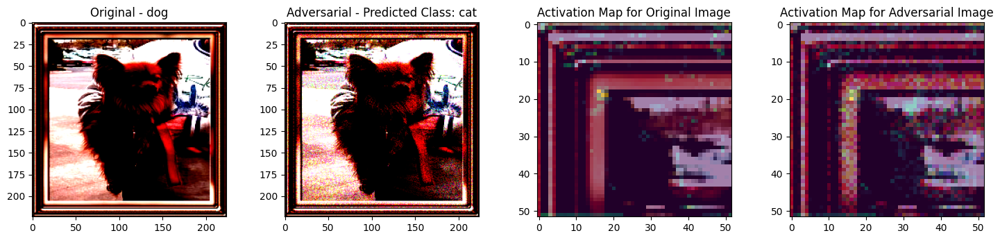

1/1 [==============================] - 0s 55ms/step


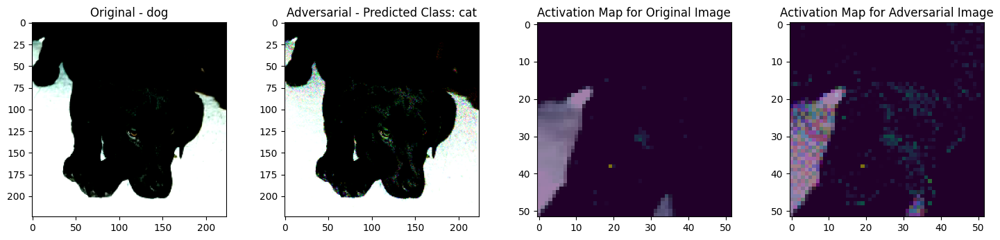

1/1 [==============================] - 0s 55ms/step


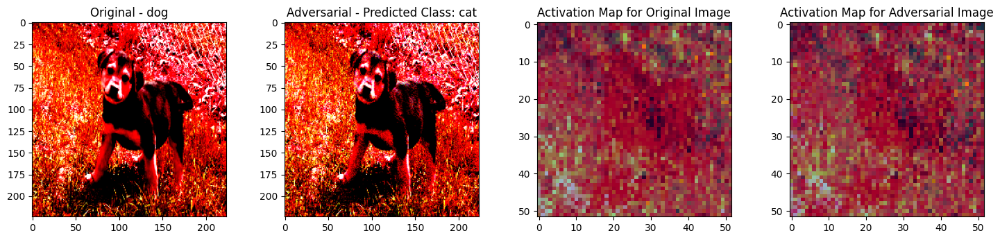

1/1 [==============================] - 0s 52ms/step


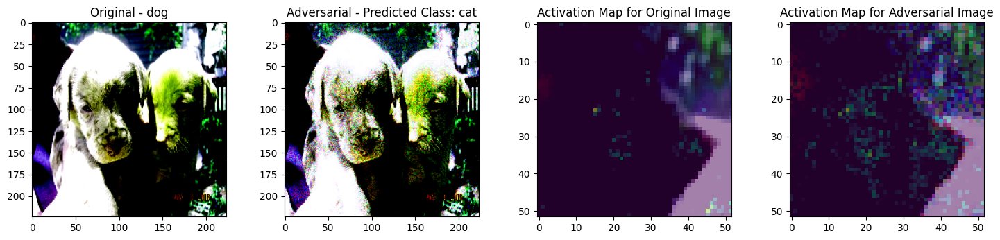

1/1 [==============================] - 0s 79ms/step


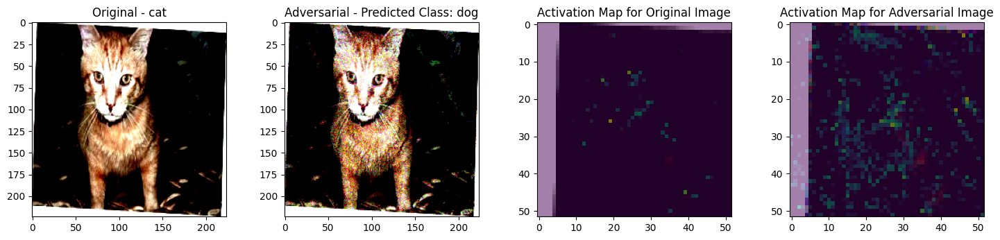

1/1 [==============================] - 0s 80ms/step


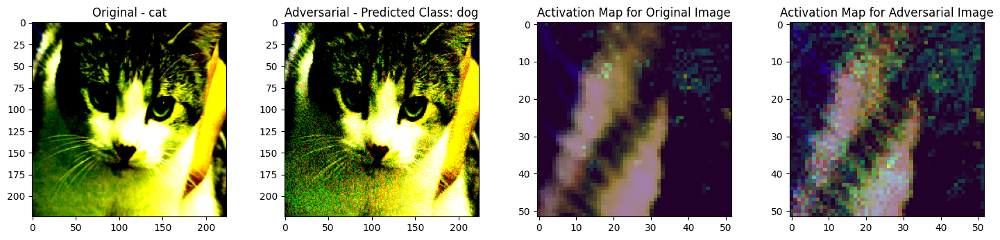

1/1 [==============================] - 0s 79ms/step


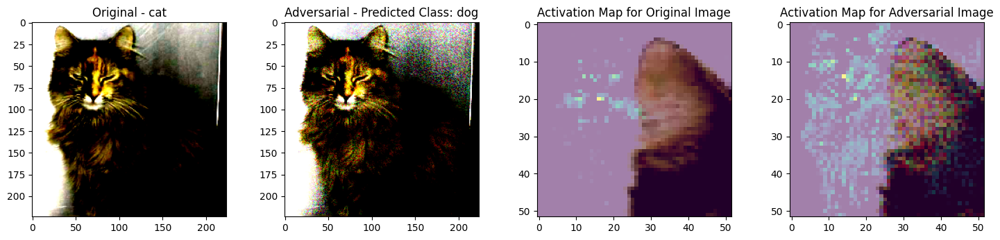

1/1 [==============================] - 0s 62ms/step


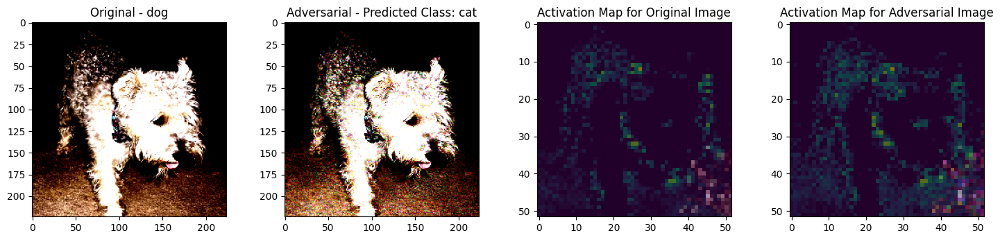

1/1 [==============================] - 0s 60ms/step


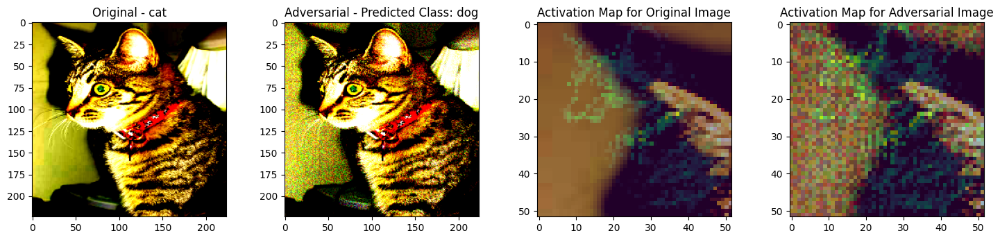

1/1 [==============================] - 0s 62ms/step


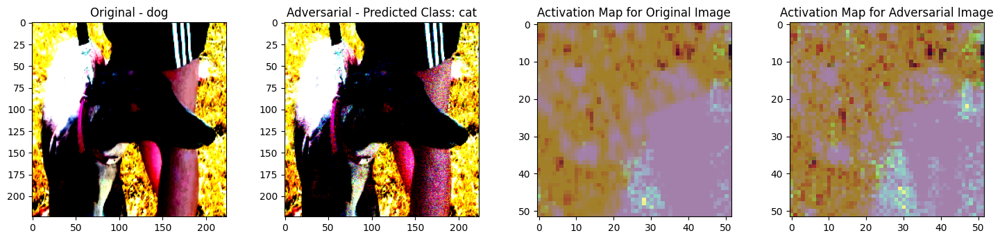

1/1 [==============================] - 0s 58ms/step


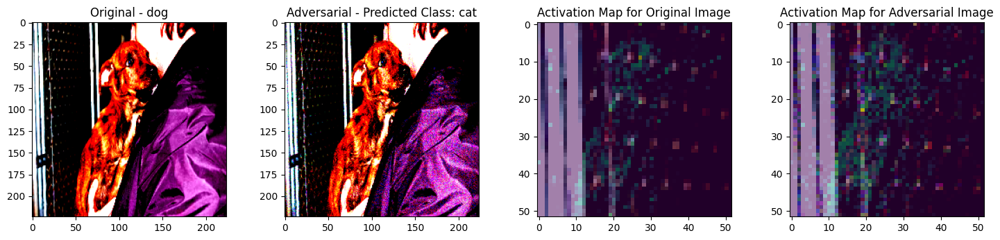

1/1 [==============================] - 0s 62ms/step


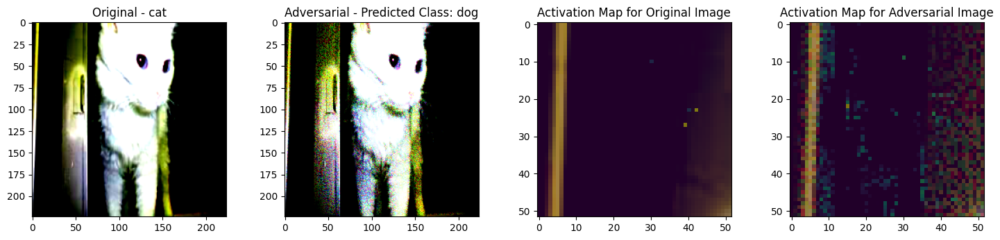

1/1 [==============================] - 0s 62ms/step


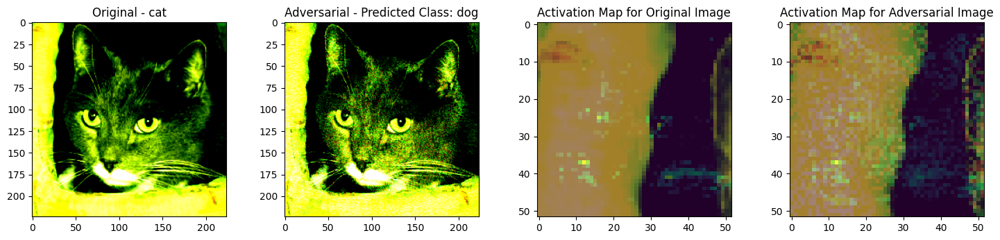

1/1 [==============================] - 0s 64ms/step


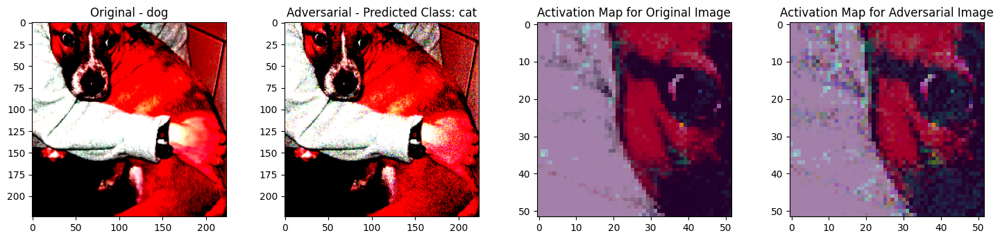

1/1 [==============================] - 0s 69ms/step


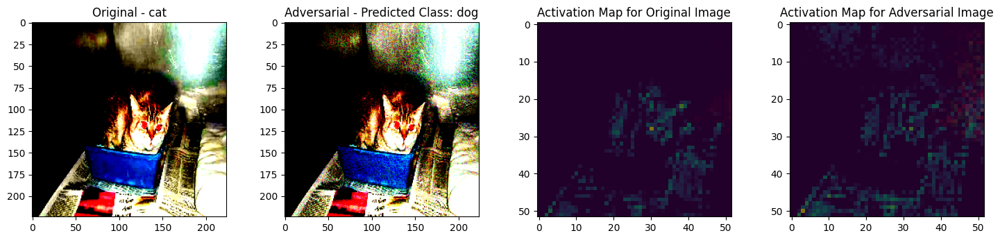

1/1 [==============================] - 0s 95ms/step


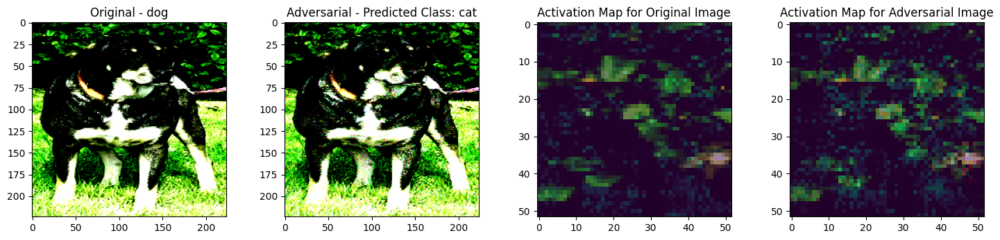

1/1 [==============================] - 0s 90ms/step


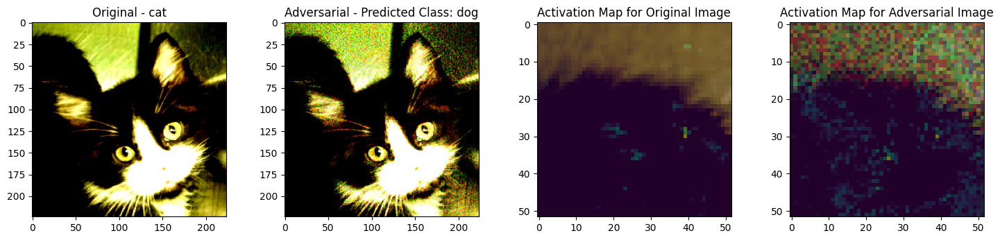

1/1 [==============================] - 0s 134ms/step


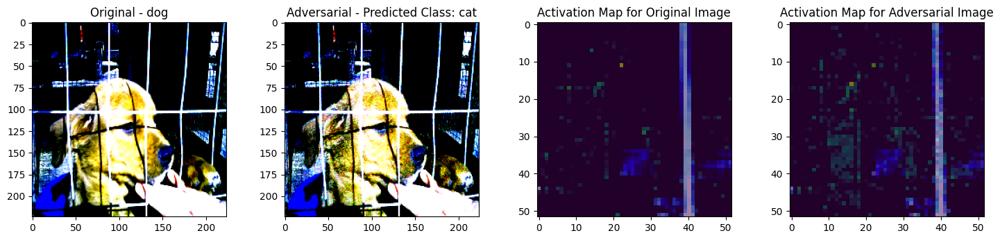

1/1 [==============================] - 0s 78ms/step


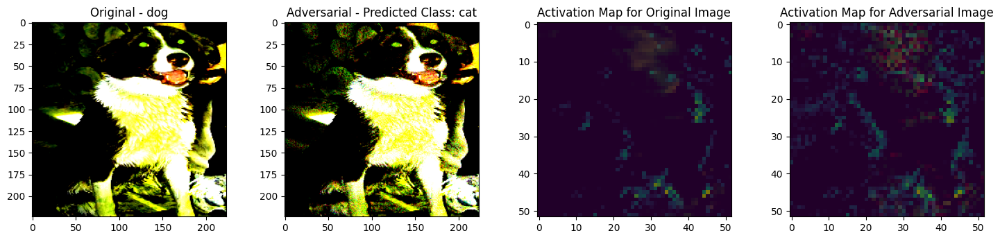

1/1 [==============================] - 0s 78ms/step


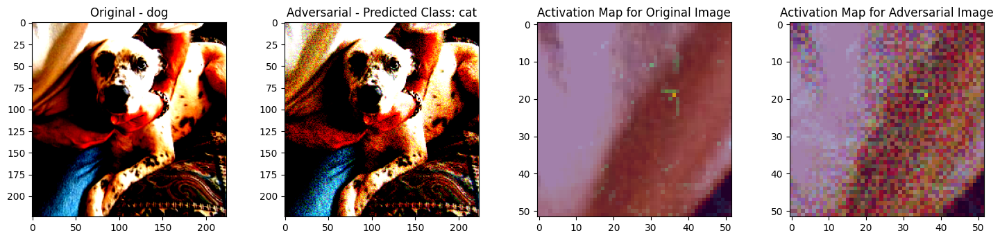

1/1 [==============================] - 0s 86ms/step


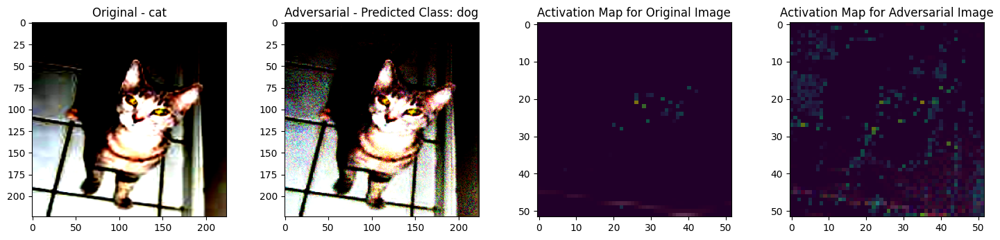

1/1 [==============================] - 0s 80ms/step


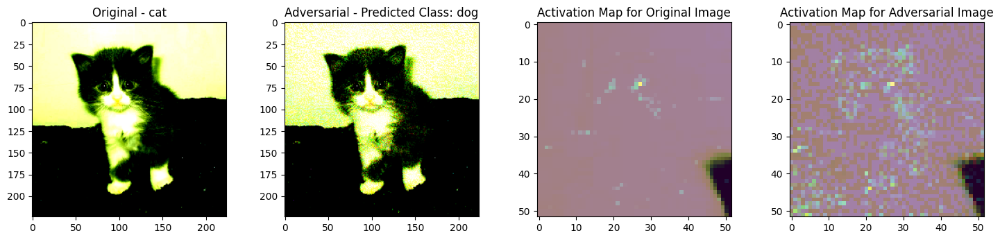

1/1 [==============================] - 0s 58ms/step


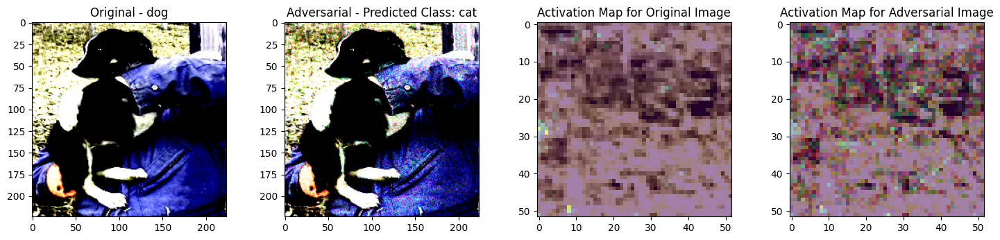

1/1 [==============================] - 0s 82ms/step


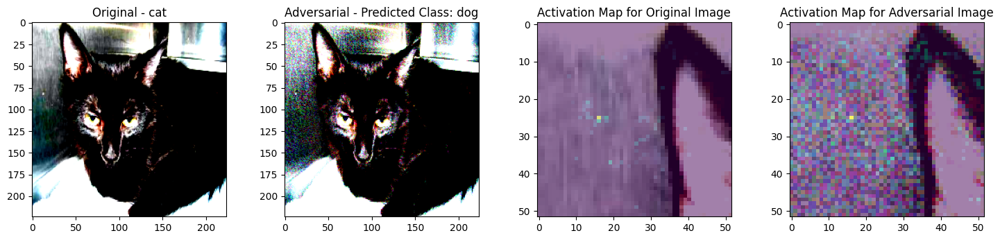

1/1 [==============================] - 0s 102ms/step


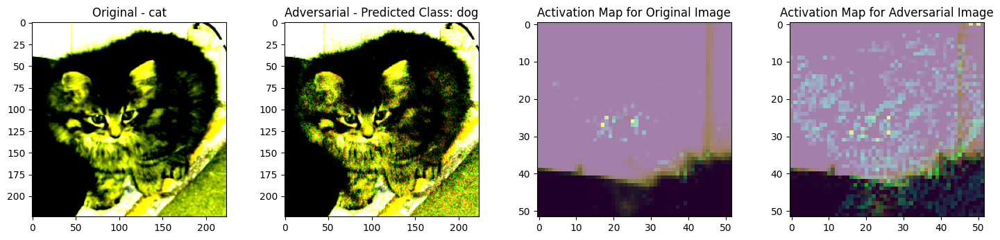

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import Sequential, layers
import matplotlib.pyplot as plt
import tensorflow_datasets as tfds
from art.attacks.evasion import FastGradientMethod
from art.estimators.classification import TensorFlowV2Classifier
dataset, dataset_info = tfds.load('cats_vs_dogs', split='train', with_info=True, as_supervised=True)
num_classes = 2
def preprocess_image(image, label):
    image = tf.image.resize(image, (224, 224))
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_brightness(image, max_delta=0.2)
    image = tf.image.random_contrast(image, lower=0.2, upper=1.8)
    image = tf.image.random_hue(image, max_delta=0.1)
    image = tf.image.random_saturation(image, lower=0.2, upper=1.8)
    image = tf.image.per_image_standardization(image)
    label = tf.one_hot(label, num_classes)
    return image, label

dataset = dataset.map(preprocess_image)
num_samples = dataset_info.splits['train'].num_examples
num_train_samples = int(0.8 * num_samples)
num_val_samples = int(0.1 * num_samples)
num_test_samples = num_samples - num_train_samples - num_val_samples

train_dataset = dataset.take(num_train_samples)
remaining_dataset = dataset.skip(num_train_samples)
val_dataset = remaining_dataset.take(num_val_samples)
test_dataset = remaining_dataset.skip(num_val_samples)
batch_size = 32
train_dataset = train_dataset.batch(batch_size)
val_dataset = val_dataset.batch(batch_size)
test_dataset = test_dataset.batch(batch_size)
class_names = dataset_info.features['label'].names
model = Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    layers.MaxPooling2D(2, 2),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D(2, 2),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D(2, 2),
    layers.Flatten(),
    layers.Dense(512, activation='relu'),
    layers.Dense(num_classes, activation='softmax')
])
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.fit(train_dataset, epochs=1, validation_data=val_dataset)
# GAN
def build_gan():
    generator = Sequential([
        layers.Dense(256, activation='relu', input_shape=(100,)),
        layers.Reshape((4, 4, 16)),
        layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', activation='relu'),
        layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same', activation='relu'),
        layers.Conv2DTranspose(3, (4, 4), strides=(2, 2), padding='same', activation='sigmoid')
    ])
    discriminator = Sequential([
        layers.Conv2D(64, (3, 3), strides=(2, 2), padding='same', activation='relu', input_shape=(224, 224, 3)),
        layers.Conv2D(128, (3, 3), strides=(2, 2), padding='same', activation='relu'),
        layers.Flatten(),
        layers.Dense(1, activation='sigmoid')
    ])
    discriminator.trainable = False
    gan = Sequential([generator, discriminator])
    gan.compile(optimizer='adam', loss='binary_crossentropy')
art_classifier = TensorFlowV2Classifier(
    model=model,
    nb_classes=num_classes,
    input_shape=(224, 224, 3),
    loss_object=tf.keras.losses.CategoricalCrossentropy(),
)
test_batch = next(iter(test_dataset))
test_images, test_labels = test_batch
test_images_np = test_images.numpy()
attack = FastGradientMethod(estimator=art_classifier, eps=0.2)
adversarial_test_images = attack.generate(test_images_np, y=test_labels.numpy())
def generate_activation_map(model, layer_index, input_image):
    activation_model = tf.keras.models.Model(inputs=model.input, outputs=model.layers[layer_index].output)
    activation = activation_model.predict(input_image[tf.newaxis, ...])
    return activation[0]
layer_index_to_visualize = 4
num_display = 25
for i in range(num_display):
    image_to_visualize_original = test_images[i]
    image_to_visualize_adversarial = adversarial_test_images[i]
    original_label_index = np.argmax(test_labels[i].numpy())
    original_label = class_names[original_label_index]
    activation_map_original = generate_activation_map(model, layer_index_to_visualize, image_to_visualize_original)
    activation_map_adversarial = generate_activation_map(model, layer_index_to_visualize, image_to_visualize_adversarial)
    plt.figure(figsize=(18, 8))
    plt.subplot(2, 4, 1)
    plt.imshow(image_to_visualize_original)
    plt.title(f'Original - {original_label}')
    plt.subplot(2, 4, 2)
    plt.imshow(image_to_visualize_adversarial)
    plt.title(f'Adversarial - Predicted Class: {class_names[np.argmax(art_classifier.predict(image_to_visualize_adversarial[tf.newaxis, ...]))]}')
    plt.subplot(2, 4, 3)
    plt.imshow(image_to_visualize_original)
    plt.imshow(activation_map_original[:, :, 0], cmap='viridis', alpha=0.5)  # Overlay activation map
    plt.title(f'Activation Map for Original Image')
    plt.subplot(2, 4, 4)
    plt.imshow(image_to_visualize_adversarial)
    plt.imshow(activation_map_adversarial[:, :, 0], cmap='viridis', alpha=0.5)  # Overlay activation map
    plt.title(f'Activation Map for Adversarial Image')

    plt.show()

#Here is my second attempt at generating a activation map to see how the AI model is being confused using ART/GAN and which part of image it is confusing, as you can see it is working and it shows which part of image is confusing the AI


1/1 [==============================] - 0s 116ms/step


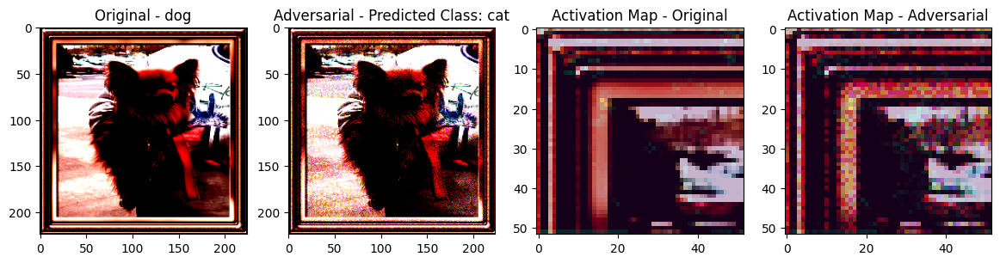

1/1 [==============================] - 0s 54ms/step


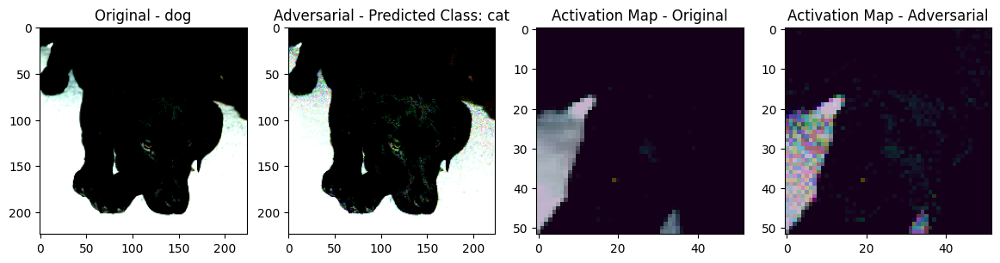

1/1 [==============================] - 0s 55ms/step


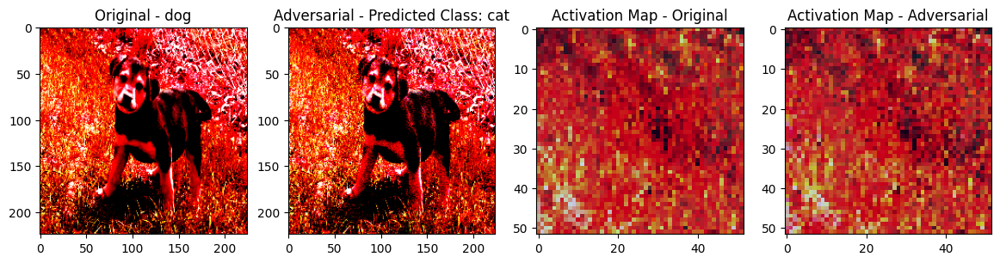

1/1 [==============================] - 0s 79ms/step


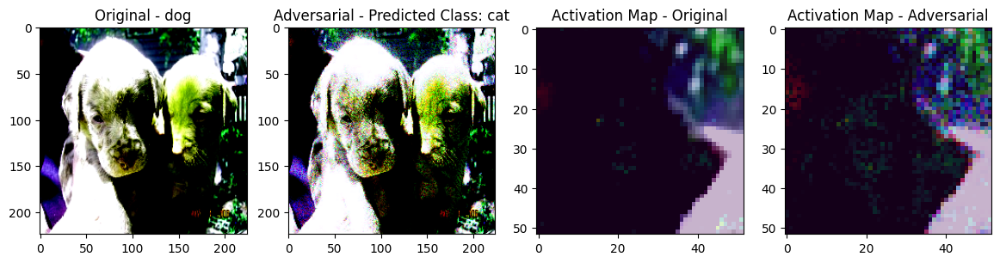

1/1 [==============================] - 0s 79ms/step


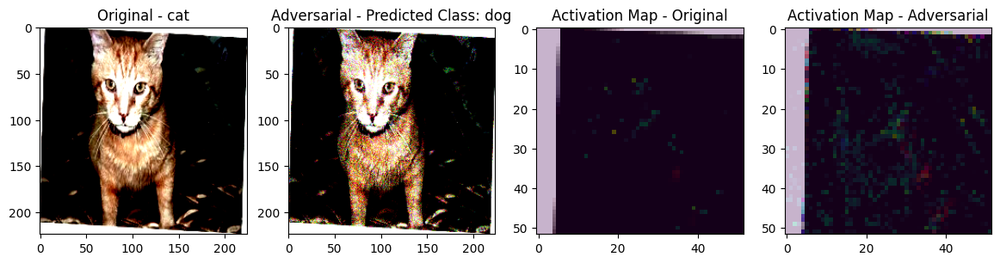

1/1 [==============================] - 0s 85ms/step


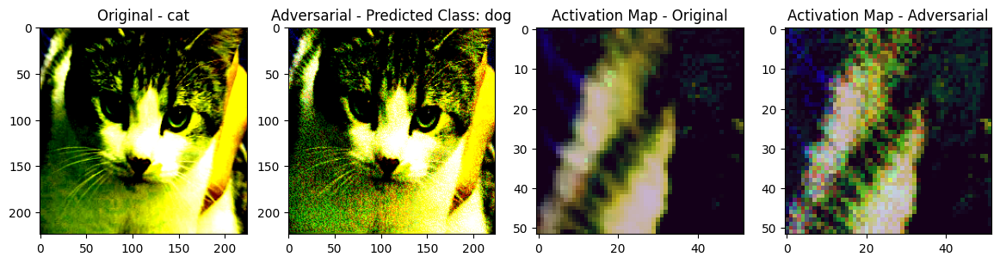

1/1 [==============================] - 0s 64ms/step


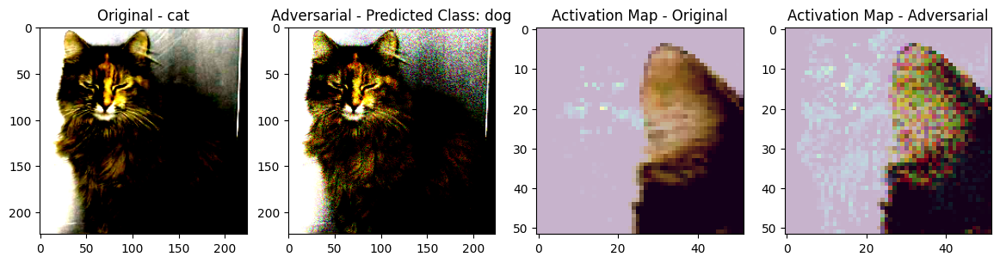

1/1 [==============================] - 0s 66ms/step


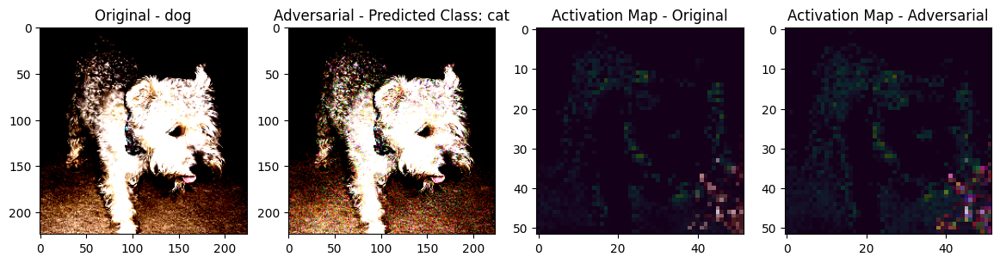

1/1 [==============================] - 0s 58ms/step


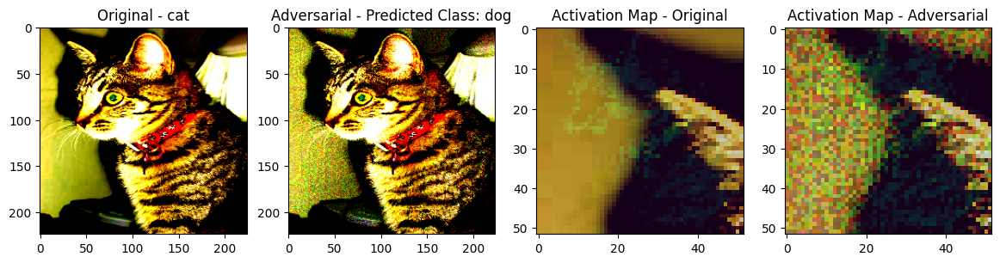

1/1 [==============================] - 0s 56ms/step


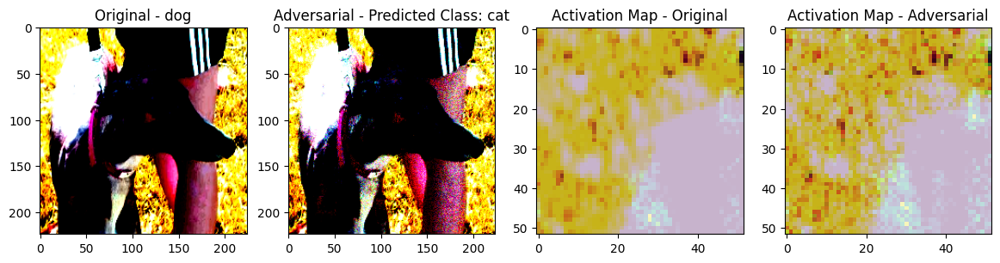

1/1 [==============================] - 0s 59ms/step


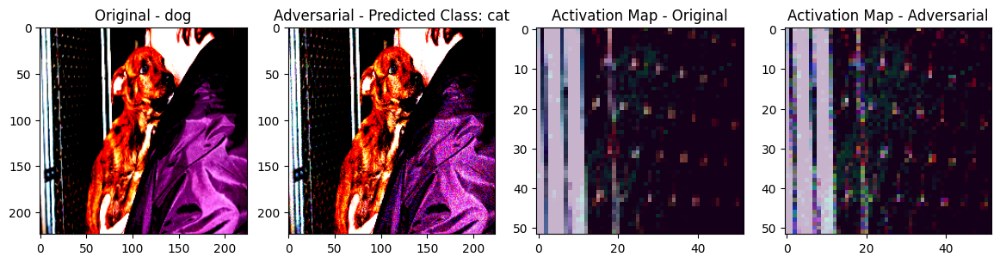

1/1 [==============================] - 0s 59ms/step


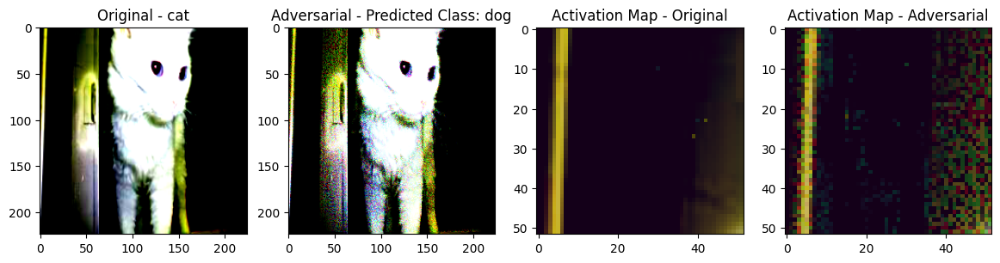

1/1 [==============================] - 0s 59ms/step


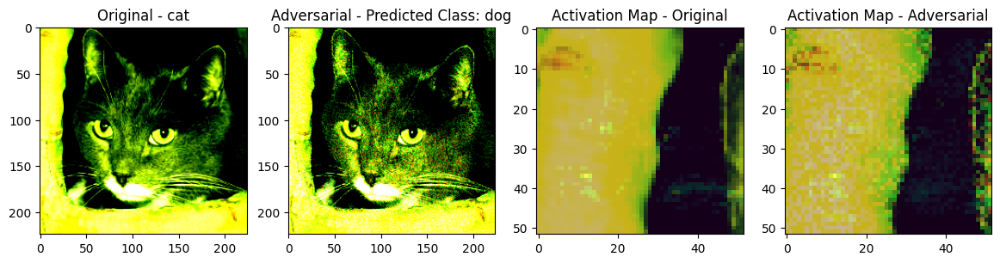

1/1 [==============================] - 0s 57ms/step


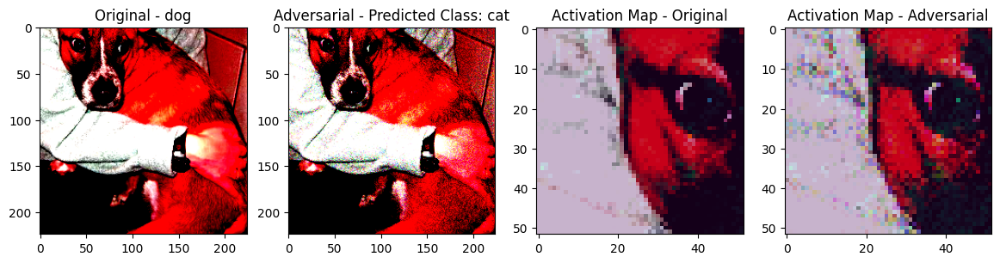

1/1 [==============================] - 0s 63ms/step


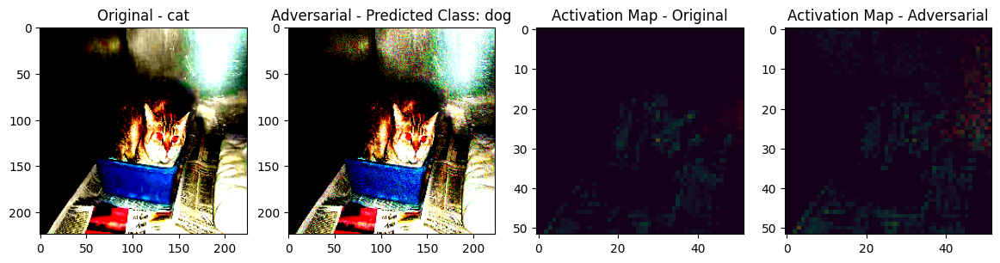

1/1 [==============================] - 0s 60ms/step


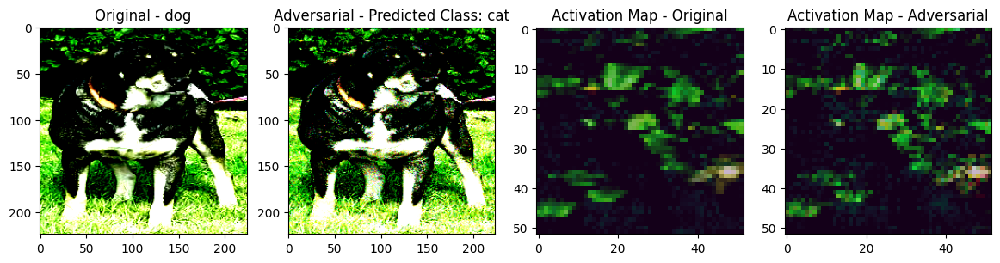

1/1 [==============================] - 0s 111ms/step


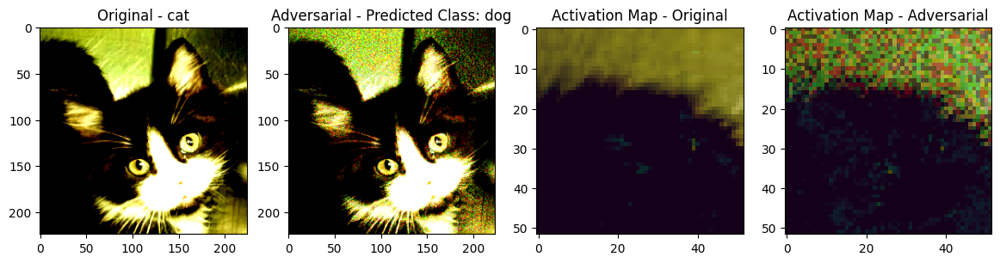

1/1 [==============================] - 0s 133ms/step


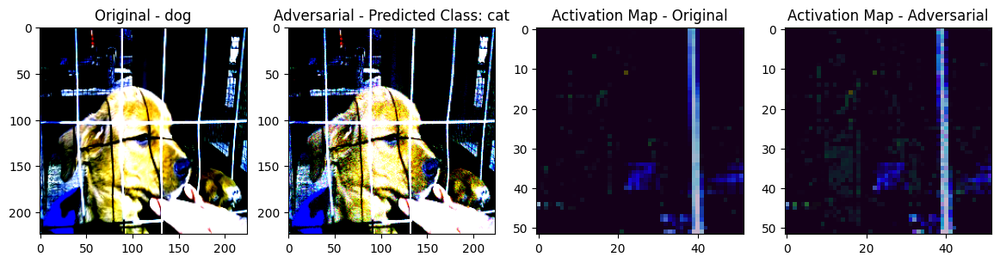

1/1 [==============================] - 0s 102ms/step


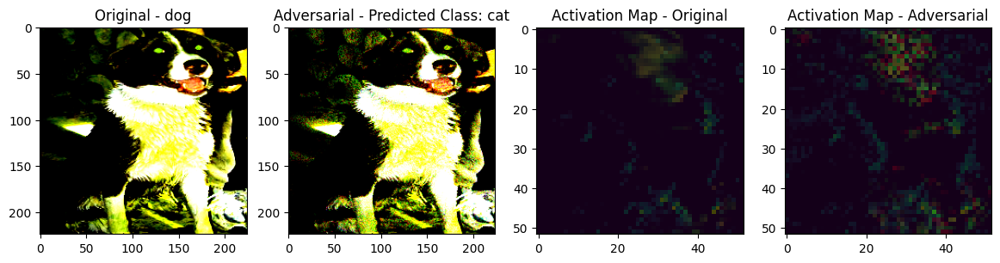

1/1 [==============================] - 0s 77ms/step


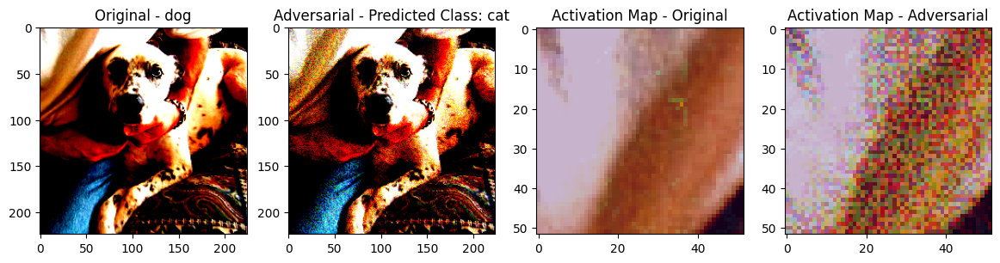

1/1 [==============================] - 0s 76ms/step


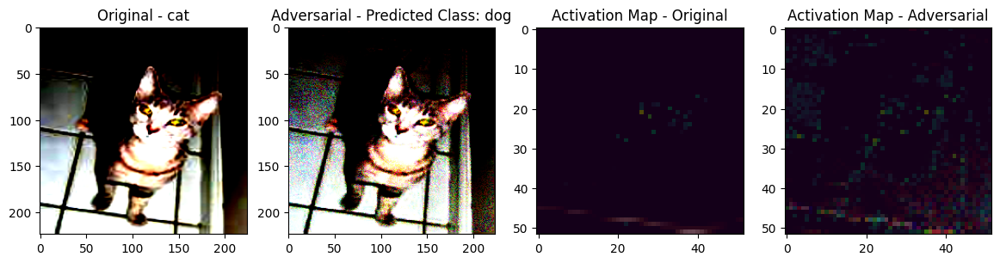

1/1 [==============================] - 0s 80ms/step


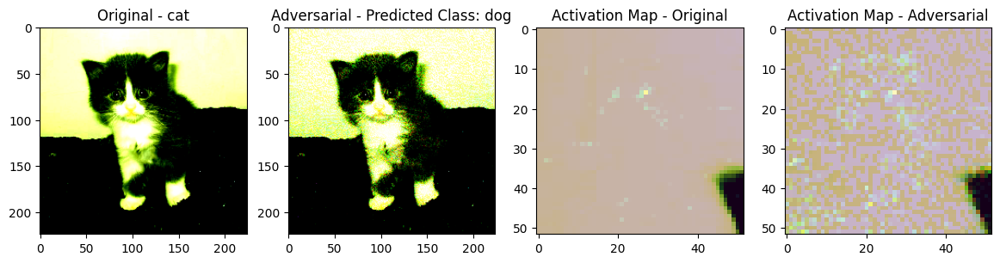

1/1 [==============================] - 0s 73ms/step


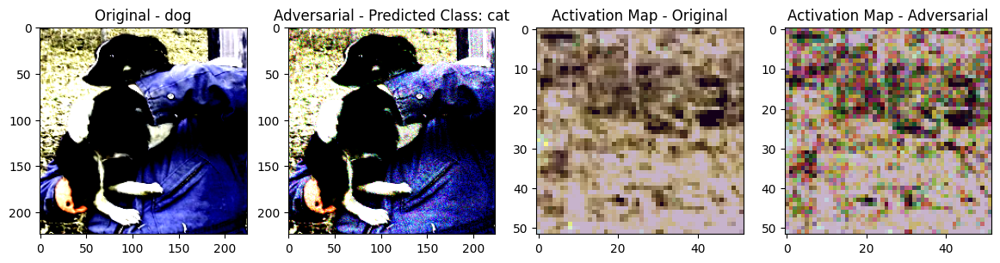

1/1 [==============================] - 0s 77ms/step


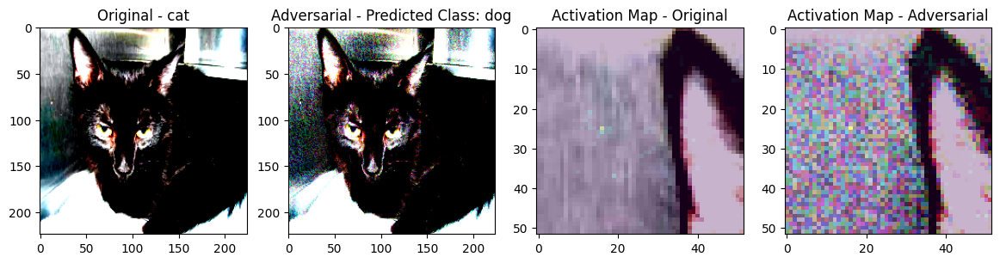

1/1 [==============================] - 0s 75ms/step


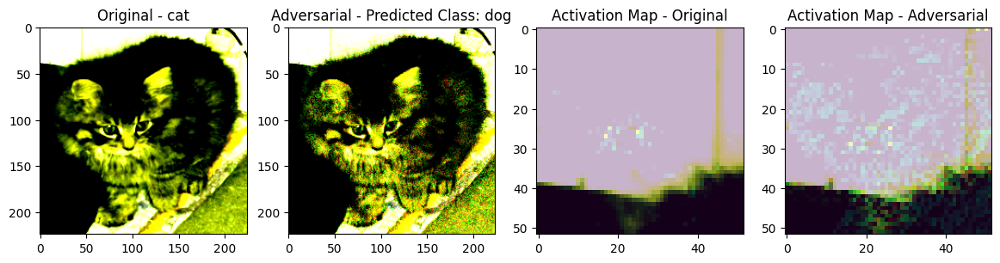

In [ ]:
num_display = 25
for i in range(num_display):
    image_to_visualize_original = test_images[i]
    image_to_visualize_adversarial = adversarial_test_images[i]

    original_label_index = np.argmax(test_labels[i].numpy())
    original_label = class_names[original_label_index]

    activation_map_original = generate_activation_map(model, layer_index_to_visualize, image_to_visualize_original)
    activation_map_adversarial = generate_activation_map(model, layer_index_to_visualize, image_to_visualize_adversarial)

    plt.figure(figsize=(18, 8))
    plt.subplot(2, 5, 1)
    plt.imshow(image_to_visualize_original)
    plt.title(f'Original - {original_label}')
    plt.subplot(2, 5, 2)
    plt.imshow(image_to_visualize_adversarial)
    plt.title(f'Adversarial - Predicted Class: {class_names[np.argmax(art_classifier.predict(image_to_visualize_adversarial[tf.newaxis, ...]))]}')
    plt.subplot(2, 5, 3)
    plt.imshow(image_to_visualize_original)
    plt.imshow(activation_map_original[:, :, 0], cmap='viridis', alpha=0.3)
    plt.title(f'Activation Map - Original')
    plt.subplot(2, 5, 4)
    plt.imshow(image_to_visualize_adversarial)
    plt.imshow(activation_map_adversarial[:, :, 0], cmap='viridis', alpha=0.3)
    plt.title(f'Activation Map - Adversarial')

    plt.show()

#Here it shows 25 images with the respective ART/GAN and how it is confusing the model
